# <a href="https://mipt-stats.gitlab.io/courses/ad_mipt.html">Phystech@DataScience</a>
## Задание 6

**Правила:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_pds_bot`.
* Дедлайн **12 мая в 22:00**. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно ноутбук в формате `ipynb` и все фотографии, если пишете теоретическую часть от руки.
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Публикация решения может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него.

-----

*Замечания.* Теоретические решения можно оформить
* в $\LaTeX$-формате в ноутбуке;
* написать от руки и прикрепить к ноутбуку;
* написать от руки и выслать боту.  

Во втором случае также **важно** "вшить" фото в ноутбук. Сделать это можно с помощью Edit -> Insert Image в Jupyter или с помощью кнопки "Вставить изображение" в Colab. Следите за размером итогового файла.

Фотографии принимаются только в хорошем качестве, **следите за освещением и почерком**. На фотографиях также указывайте номера задач.

-----

In [2]:
import numpy as np
import pandas as pd
import scipy.stats as sps
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.3)
%matplotlib inline

In [3]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

## Задача 1 
Проводится испытание нового учебника по математике. Для исследований были отобраны 2500 школьников. Некоторые из них учились по новому учебнику, а другие — по старому. Измеряется количество школьников, сдавших пробный ЕГЭ на 4 и 5. В первой группе экзамен хорошо сдали 853  из 1719 школьников, учившихся по новому учебнику. Во второй группе значимое улучшение наблюдается среди  хорошо сдали 369  из 781 школьников, учившихся по старому. Влияет ли новый
учебник на результаты школьников?

*Задачу можно писать на листочке. Все совпадения с реальными лицами и ситуациями случайны:)*

In [3]:
z=sps.norm.ppf(0.95)
p1=853/1719
p2=369/781
s=np.sqrt(p1*(1-p1)/1719+p2*(1-p2)/781)
print('Доверительный интервал: С=(',p1-p2-z*s,',1)')
print('Значение статистики: W(x,y)=',(p1-p2)/s)


Доверительный интервал: С=( -0.01170495678515663 ,1)
Значение статистики: W(x,y)= 1.101790604525022


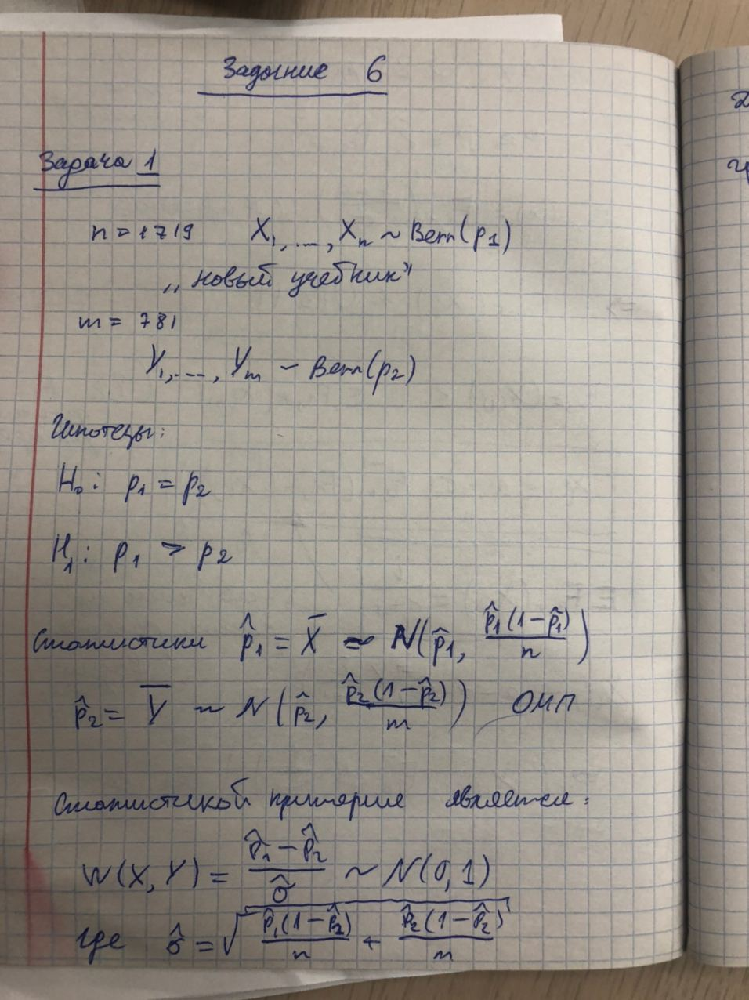

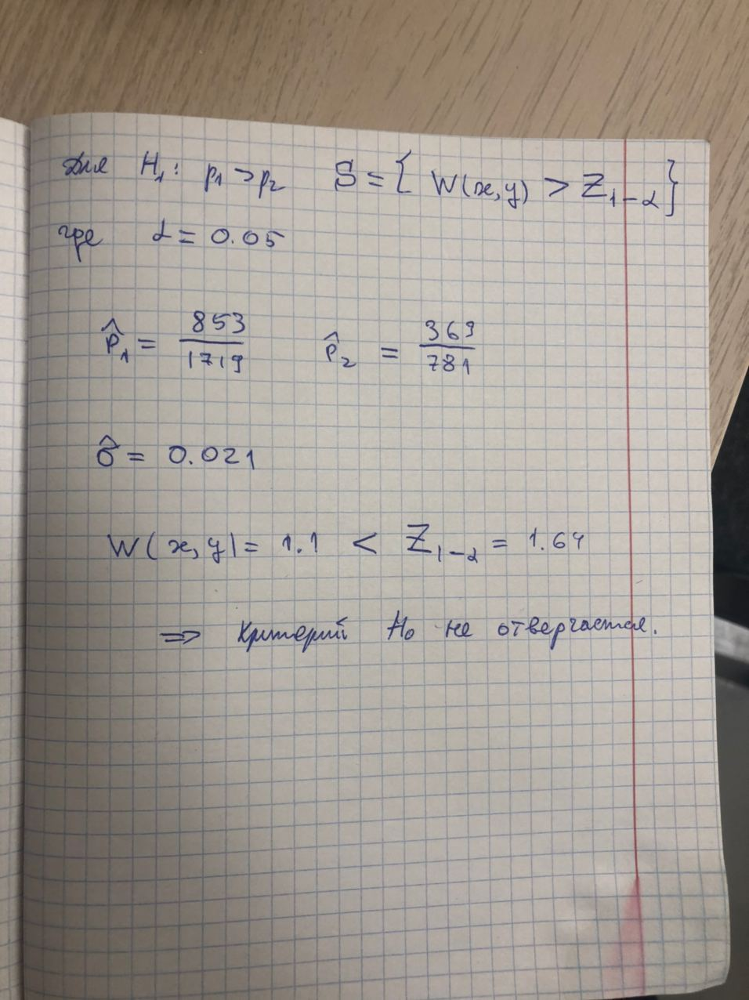

## Задача 2: Белые мыши наносят ответный удар

Скачаем [данные](https://www.kaggle.com/ruslankl/mice-protein-expression) об экспрессии генов различных белков в головном мозге белых мышей.

В этом датасете представлены уровни экспрессии 77 белков, измеренные в коре головного мозга 8 классов мышей, некоторые из которых страдают синдромом Дауна, а некоторые были подвержены контекстному обусловливанию страха, задачи, используемой для оценки ассоциативного обучения.

Данные содержат информацию о 38 контрольных мышей и 34 трисомных мышей (синдром Дауна), то есть всего 72 мышки. Проведено 15 измерений каждого белка для каждой мышки, то есть каждой мыши соответствует несколько записей в таблице.

Загрузим данные и посмотрим на начало таблицы. Всего мы имеем 82 колонки, в большинстве их которых содержатся вещественные данные (уровни экспрессии 77 белков). Остальные колонки содержат категориальные данные (с небольшим числом значений).

In [4]:
data = pd.read_csv("./Data_Cortex_Nuclear.csv")
data.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


Чтобы вспомнить, что это за данные, для начала выведем простые описательные статистики по вещественным параметрам.

In [5]:
data.describe()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,...,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,...,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,...,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,...,0.206395,0.136424,0.115554,0.110839,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423
50%,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,1.355846,...,0.224000,0.152313,0.129468,0.121626,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441
75%,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,1.561316,...,0.241655,0.174017,0.148235,0.131955,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824
max,2.516367,2.602662,0.497160,3.757641,8.482553,0.539050,0.317066,7.464070,0.306247,6.113347,...,0.358289,0.282016,0.261506,0.158748,0.256529,0.759588,0.479763,0.360692,0.413903,2.129791


Количество записей каждого класса:

In [166]:
data['class'].value_counts()

c-SC-m    150
c-CS-m    150
c-SC-s    135
t-SC-m    135
t-SC-s    135
c-CS-s    135
t-CS-m    135
t-CS-s    105
Name: class, dtype: int64

Количество записей по генотипам:

In [179]:
data.Genotype.value_counts()

Ts65Dn     297
Control    255
Name: Genotype, dtype: int64

In [5]:
data=data.dropna()

В начале исследования полезно посмотреть на данные визуально. Посмотрим на зависимость уровней экспрессии разных белков друг от друга. Визуализируйте данные в первых десяти колонках в двумерных проекциях, используя `sns.pairplot`. 

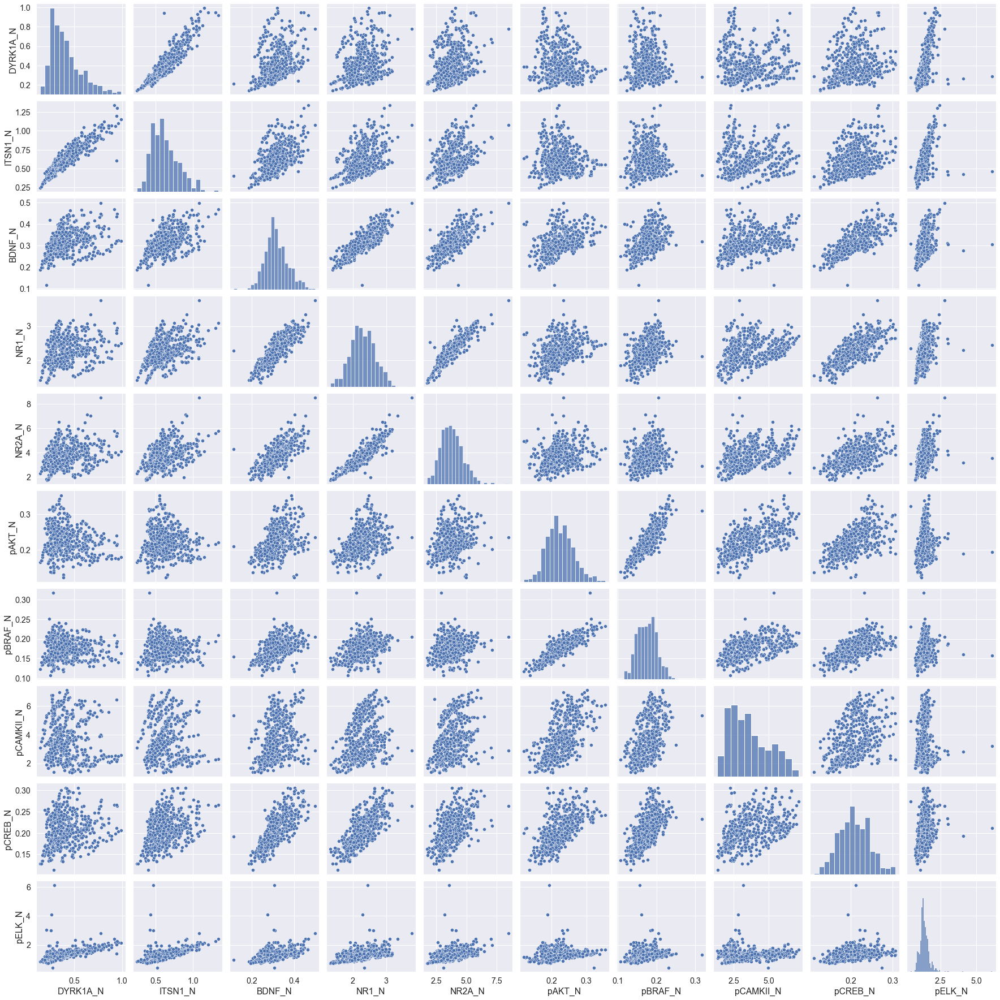

In [88]:
sns.pairplot(data.iloc[:,1:11])

При визуализации в двумерных проекциях можно также строить ядерные оценки плотности:

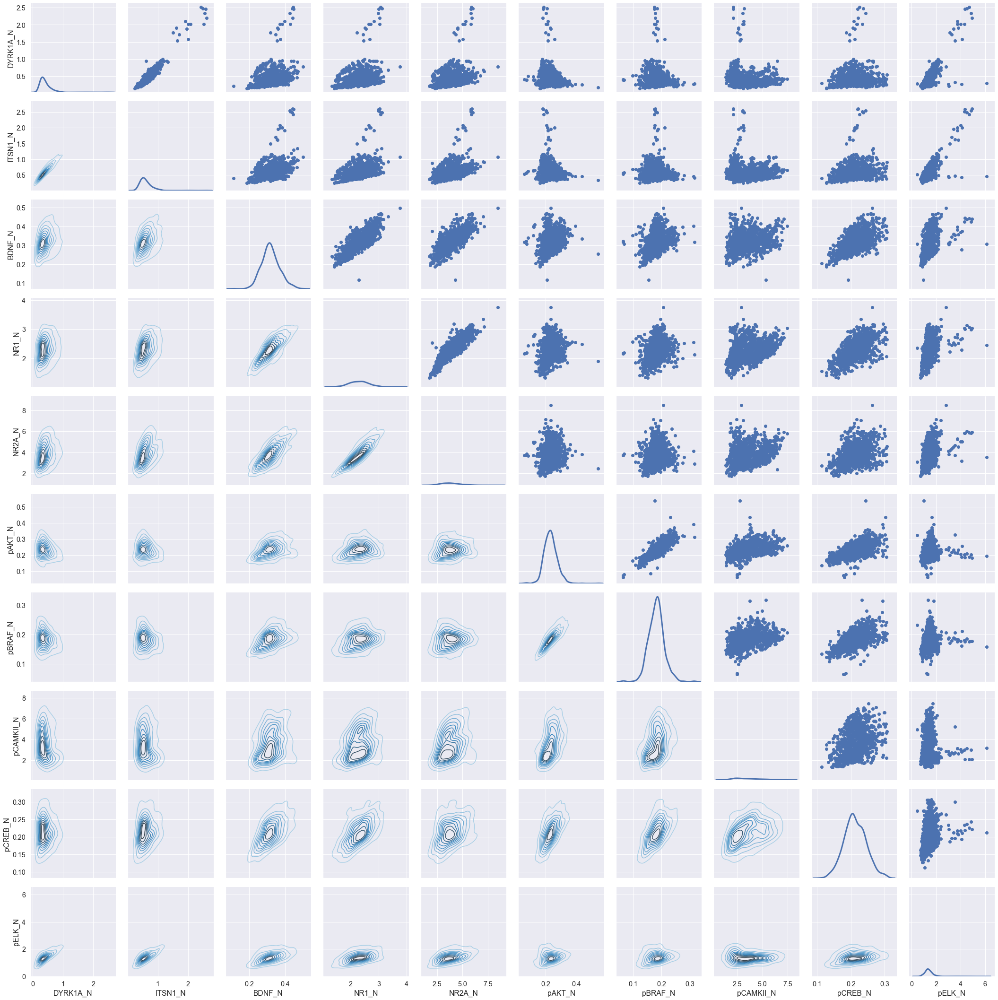

In [9]:
g = sns.PairGrid(data.iloc[:, 1:11].dropna(), height=3)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_upper(plt.scatter)
g.map_diag(sns.kdeplot, lw=3)

Посчитайте корреляционную матрицу признаков, соответствующих белкам, и выведите ее с помощью `sns.heatmap`, также выведя значения коэффициентов корреляции в ячейках матрицы.

а) для первых 15 признаков. Сравните корреляционные матрицы, полученные  с использованием трех известных вам коэффициентов корреляции.


б) для всех признаков с использованием коэффициента Спирмена.



In [89]:

r_s = sps.spearmanr(data.iloc[:,1:16],nan_policy='omit')[0]
r_k = np.zeros((15,15))
for j in range(15):
    for i in range(15):
        r_k[i,j] = sps.kendalltau(data.iloc[:,i+1].values,data.iloc[:,j+1].values,nan_policy='omit')[0]


In [93]:
r_p = np.corrcoef(data.iloc[:,1:16],rowvar=False)

Text(0.5, 1.0, 'Pearson')

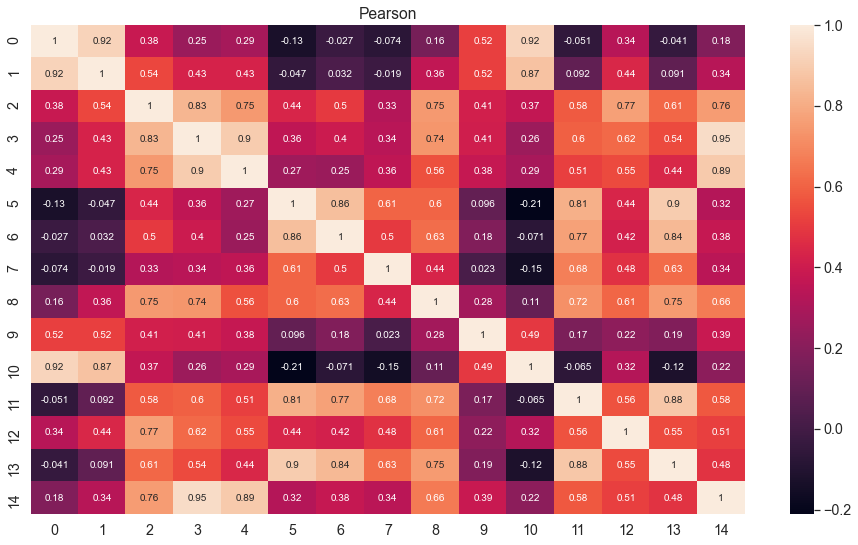

In [104]:
plt.figure(figsize=(16,9))
sns.heatmap(r_p,annot=True)
plt.title('Pearson')

Text(0.5, 1.0, 'Kendall')

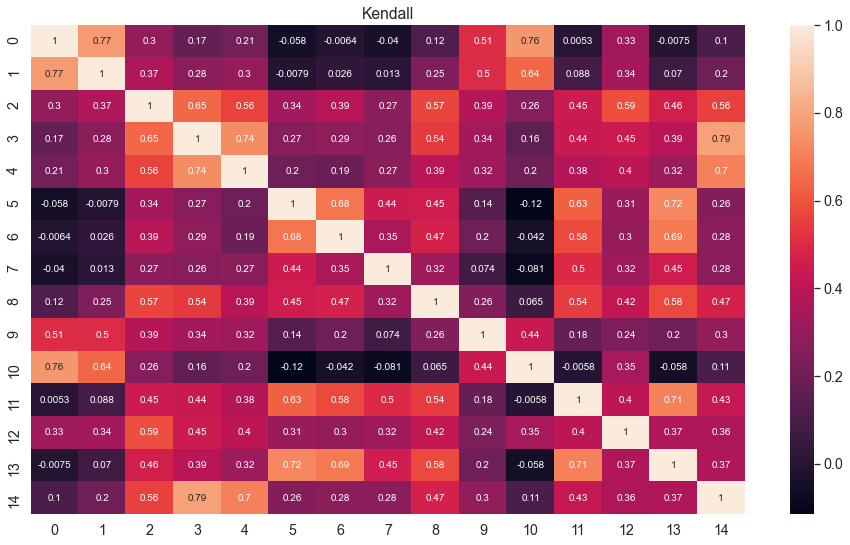

In [103]:
plt.figure(figsize=(16,9))
sns.heatmap(r_k,annot=True)
plt.title('Kendall')

Text(0.5, 1.0, 'Spearman')

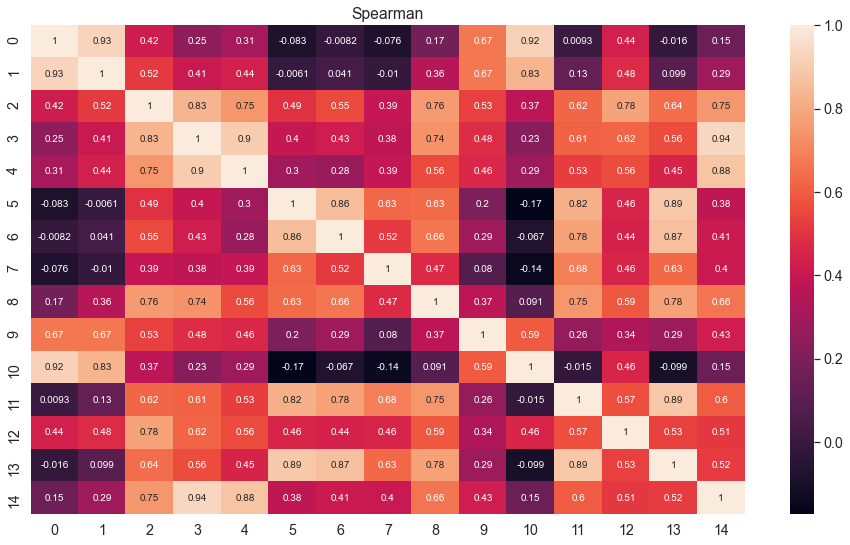

In [106]:
plt.figure(figsize=(16,9))
sns.heatmap(r_s,annot=True)
plt.title('Spearman')

б)

In [108]:
r_ss = sps.spearmanr(data,nan_policy='omit')[0]

<AxesSubplot:>

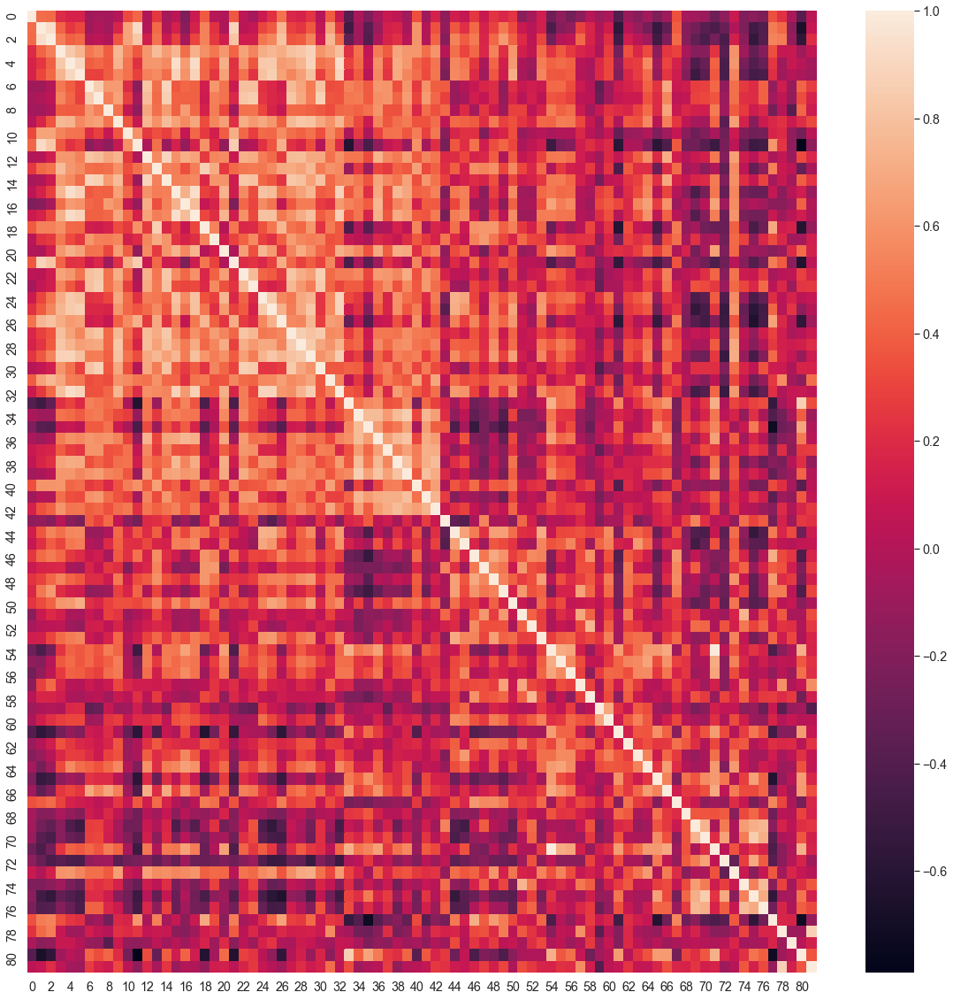

In [110]:
plt.figure(figsize=(20,20))
sns.heatmap(r_ss)

**Вывод**

Далее мы будем исследовать зависимость уровня экспрессии от генотипа. У нас имеется всего два генотипа: обычные мыши и мыши с синдромом Дауна.



Визуализируйте двумерные проекции данных и ядерные оценки плотности с использованием `sns.PairGrid` отдельно по генотипам. Используйте `hue='Genotype'` при вызове `sns.PairGrid`. По параметру `hue`  происходит разделение датасета.

In [14]:
df1=pd.concat([data.iloc[:,1:11],data['Genotype']],axis=1)

In [163]:
data.iloc[:,2]

75      0.828696
76      0.841974
77      0.852882
78      0.755390
79      0.757917
          ...   
1045    0.595792
1046    0.586510
1047    0.562547
1048    0.551467
1049    0.552861
Name: ITSN1_N, Length: 552, dtype: float64

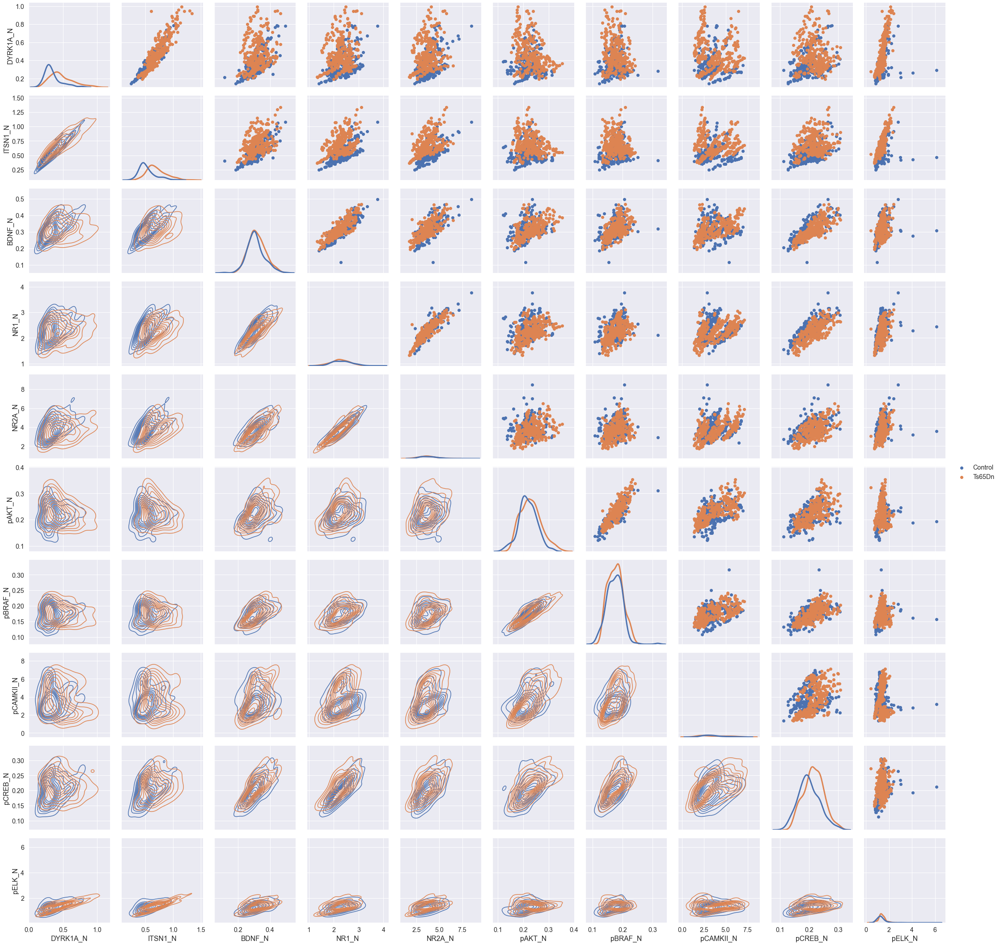

In [17]:
g = sns.PairGrid(df1, hue='Genotype', height=3)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_upper(plt.scatter)
g.map_diag(sns.kdeplot, lw=3)
g.add_legend(title="", adjust_subtitles=True)

#### 1. Корреляционный анализ

##### 1.1 Влияние генотипа на экспрессию DYRK1A_N 



С помощью ядерных оценок плотности посмотрите, как отличаются распределения `DYRK1A_N` для разных генотипов.

<AxesSubplot:title={'center':'Control'}, xlabel='DYRK1A_N', ylabel='Density'>

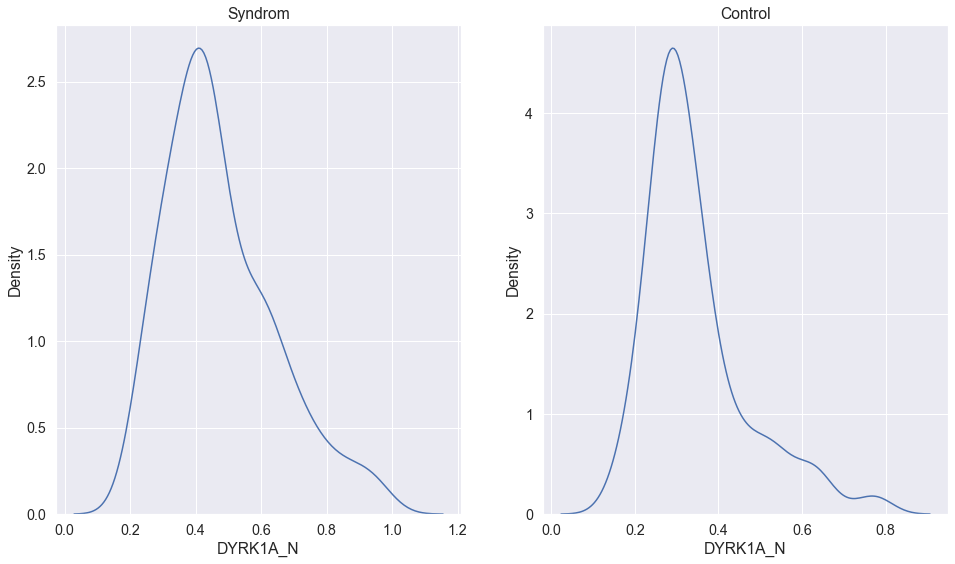

In [85]:
    Syn = data[data['Genotype']=='Ts65Dn'].iloc[:,1]
    Con = data[data['Genotype']=='Control'].iloc[:,1]
    plt.figure(figsize=(16,9))
    plt.subplot(1,2,1,title='Syndrom')
    sns.kdeplot(Syn)
    plt.subplot(1,2,2,title='Control')
    sns.kdeplot(Con)

In [90]:
print(Syn.size,Con.size)
Syn[(Syn>0.8)&(Syn<1.2)].size

297 255


16

Избавьтесь от выбросов и `nan`. Разделите все значения на 5 корзин и составьте таблицу сопряженности. Можно воспользоваться функцией `np.histogram2d`. В итоге у вас должна получиться таблица размера $5\times2$.


In [64]:
xed = [0,0.2,0.4,0.7,0.8,1]
d1=pd.Series([data['Genotype'].values[i] for i in range(data.Genotype.size)])
d1[d1=='Control']=1
d1[d1=='Ts65Dn']=0


In [65]:
H=np.histogram2d(data.iloc[:,1].values,d1,bins=(xed,[-0.1,0.5,1.1]))[0]
print('Матрица сопряженности:\n',H) # Первый столбец отвечает значению "0", то есть "Ts65Dn", 
print('Корзины:\n',np.histogram2d(data.iloc[:,1],d1,bins=(xed,[0,0.5,1]))[1])                                                     #второй столбец "Сontrol"

Матрица сопряженности:
 [[  1.  12.]
 [110. 187.]
 [152.  51.]
 [ 18.   5.]
 [ 16.   0.]]
Корзины:
 [0.  0.2 0.4 0.7 0.8 1. ]


Примените критерий хи-квадрат. Следите за условиями применимости критерия.

1) число n>>50
2) $\frac{n_{i\cdot}n_{\cdot j}}{n}$ < 5 в не более 5% точно , n =552

In [66]:
chi=sps.chi2_contingency(H)
print('Значение статистики:',chi[0])
print('Значение p-value',chi[1])
print('dof',chi[2])

Значение статистики: 100.25445631089084
Значение p-value 8.683077298727581e-21
dof 4


Сделайте выводы.  

**Вывод** Значение p-value много меньше уровня значимости что говорит о том, что значение генотипа влияет на уровень экспрессии гена.

##### 1.1 Влияние генотипа на экспрессию BDNF_N

Проведите те же исследования для признака  BDNF_N, начиная с ядерных оценок. Сделайте выводы.

<AxesSubplot:title={'center':'Control'}, xlabel='BDNF_N', ylabel='Density'>

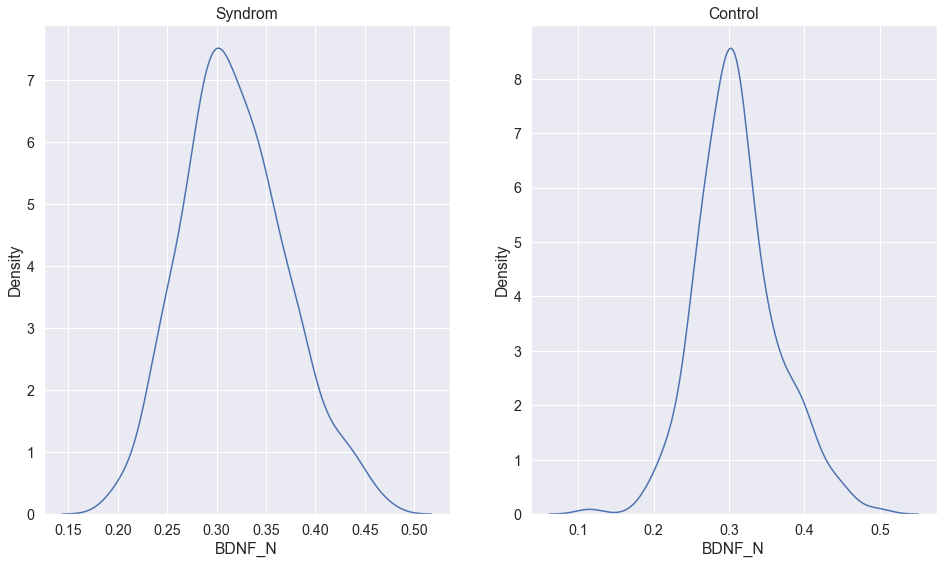

In [71]:
    Syn1 = data[data['Genotype']=='Ts65Dn']['BDNF_N']
    Con1 = data[data['Genotype']=='Control']['BDNF_N']
    plt.figure(figsize=(16,9))
    plt.subplot(1,2,1,title='Syndrom')
    sns.kdeplot(Syn1)
    plt.subplot(1,2,2,title='Control')
    sns.kdeplot(Con1)

In [38]:
xed1 = [0,0.2,0.25,0.35,0.4,0.5]

In [64]:
H1=np.histogram2d(data['BDNF_N'].values,d1,bins=(xed1,[-0.1,0.5,1.1]))[0]
print('Матрица сопряженности:\n',H1) # Первый столбец отвечает значению "0", то есть "Ts65Dn", 
print('Корзины:\n',xed1)                                                     #второй столбец "Сontrol"

Матрица сопряженности:
 [[  1.   4.]
 [ 29.  18.]
 [191. 180.]
 [ 54.  34.]
 [ 22.  19.]]
Корзины:
 [0, 0.2, 0.25, 0.35, 0.4, 0.5]


In [67]:
chi1=sps.chi2_contingency(H1)
print('Значение статистики:',chi1[0])
print('Значение p-value',chi1[1])
print('dof',chi1[2])

Значение статистики: 6.306437590190513
Значение p-value 0.17740231701833634
dof 4


**Вывод** Для данного типа белка мы получили значение p-value больше уровня значимости, что говорит о том, что уровень экспрессии независим от генотипа.

#### 2. Дисперсионный анализ

##### 2.1. Зависимость распределения DYRK1A_N от генотипа

Проверьте гипотезу о равенстве распределений с использованием критерия Уилкоксона-Манна-Уитни с использованием различных альтернатив.  В реальных исследованиях нужно использовать конкретную альтернативу. 

Сделайте выводы. Также поясните, почему в данной задаче можно использовать этот критерий.

Пусть $X_1,...,X_n$ - контрольная выборка, $Y_1,...,Y_n$ - выборка с геном Ts65Dn
с распределениями $G$ и $F$ соответственно.

Альтернативы:
1) $F>G$
2) $G>F$
3) $F(x-\theta)=G(x)$

In [99]:
Syn = data[data['Genotype']=='Ts65Dn'].iloc[:,1]
Con = data[data['Genotype']=='Control'].iloc[:,1]

In [101]:
print('F>G:',sps.mannwhitneyu(Syn,Con,alternative='greater'))
print('F<G:',sps.mannwhitneyu(Syn,Con,alternative='less'))
print('F!=G:',sps.mannwhitneyu(Syn,Con,alternative='two-sided'))

F>G: MannwhitneyuResult(statistic=56949.0, pvalue=8.613215595963312e-25)
F<G: MannwhitneyuResult(statistic=56949.0, pvalue=1.0)
F!=G: MannwhitneyuResult(statistic=56949.0, pvalue=1.7226431191926625e-24)


**Вывод**

Посчитайте реализацию оценки сдвига, связанную со статистикой Манна-Уитни, см. лекцию 10.

In [105]:
n=Syn.size
m=Con.size
W=np.zeros((Syn.size,Con.size))
for i in range(Syn.size):
    for j in range(Con.size):
        W[i,j]=Syn.values[i]-Con.values[j]
theta=np.median(W)
k_a=int(np.floor(n*m/2-1/2-sps.norm.ppf(0.95)*np.sqrt(n*m*(n+m+1)/12)))
W_a=np.sort(np.ravel(W))
print('Оценка сдвига:', "%.5f" %theta)

Оценка сдвига: 0.11967


Посчитайте реализацию доверительного интервала величины сдвига. 


In [106]:
print('доверительный интервал: (',"%.5f" %W_a[k_a] ,';',"%.5f" %W_a[n*m-k_a-1],')')

доверительный интервал: ( 0.10143 ; 0.13691 )


##### 2.2. Зависимость распределения  BDNF_N от генотипа


Проверьте гипотезу с использованием критерия Уилкоксона-Манна-Уитни при различных альтернативах, посчитайте оценку сдвига и доверительный интервал. Сделайте выводы. 

Пусть $X_1,...,X_n$ - контрольная выборка, $Y_1,...,Y_n$ - выборка с геном Ts65Dn
с распределениями $G$ и $F$ соответственно.

Альтернативы:
1) $F>G$
2) $G>F$
3) $F(x-\theta)=G(x)$

In [11]:
Syn1 = data[data['Genotype']=='Ts65Dn']['BDNF_N']
Con1 = data[data['Genotype']=='Control']['BDNF_N']

In [10]:
print('F>G:',sps.mannwhitneyu(Syn1,Con1,alternative='greater'))
print('F<G:',sps.mannwhitneyu(Syn1,Con1,alternative='less'))
print('F!=G:',sps.mannwhitneyu(Syn1,Con1,alternative='two-sided'))

F>G: MannwhitneyuResult(statistic=41330.0, pvalue=0.03193158288750249)
F<G: MannwhitneyuResult(statistic=41330.0, pvalue=0.9681067496800266)
F!=G: MannwhitneyuResult(statistic=41330.0, pvalue=0.06386316577500498)


In [42]:
n=Syn1.size
m=Con1.size
W=np.zeros((Syn1.size,Con1.size))
for i in range(Syn1.size):
    for j in range(Con1.size):
        W[i,j]=Syn1.values[i]-Con1.values[j]
theta=np.median(W)
k_a=int(np.floor(n*m/2-1/2-sps.norm.ppf(0.95)*np.sqrt(n*m*(n+m+1)/12)))
W_a=np.sort(np.ravel(W))
print('Оценка сдвига:', "%.5f" %theta)
print('доверительный интервал: (',"%.5f" %W_a[k_a] ,';',"%.5f" %W_a[n*m-k_a-1],')')

Оценка сдвига: 0.00842
доверительный интервал: ( 0.00096 ; 0.01578 )


**Вывод** Исходя из проверки гипотез можно говорить о небольшом преобладании выборки трисомных мышей. Судя по графиками оценки ядерных плотностей видно что мат ожидания распределений примерно равны, однако дисперсия выборки контрольных мышей меньше.

Как связаны доверительные интервалы с проверкой гипотез? Вам могут помочь прошлые лекции. Подтверждается ли это в данном примере?

Доверительные интервалы могут сильно помочь в проверке гипотез. Условие того, что нулевая гипотеза отвергается следующее: если $0\in C$, в нашем случае видно, что левый конец интервала больше нуля

Проверьте выборку на нормальность с помощью критерия Шапиро-Уилка и QQ-plot. Можно ли применять методы, (не)устойчивые к отклонениям от нормальности?

In [54]:
#syndrome
S=sps.shapiro(Syn1)
print('статистика',"%.5f"%S[0])
print('p-value',"%.5f"%S[1])


статистика 0.98937
p-value 0.02885


(0.05257526501034972, 0.3187122093838384, 0.995289923112401)

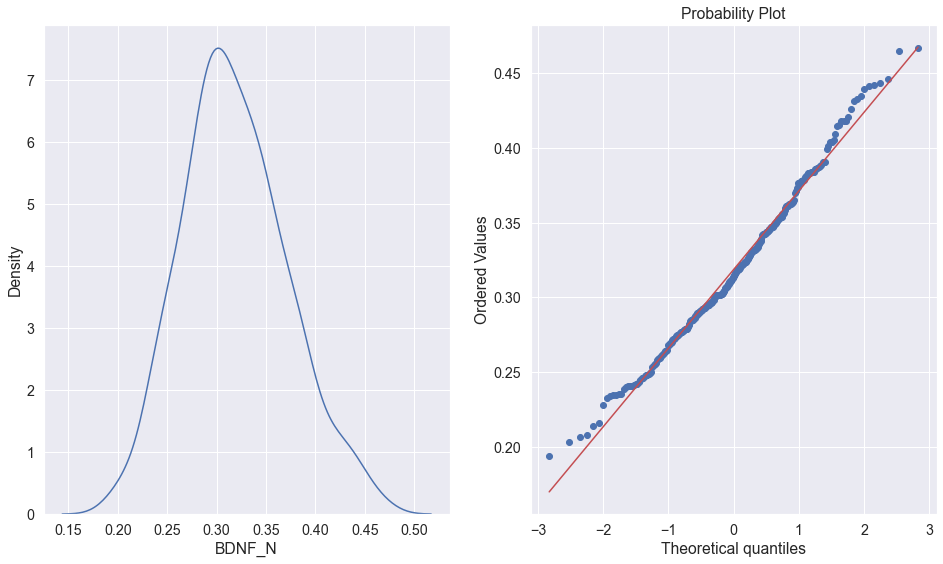

In [57]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1)
sns.kdeplot(Syn1)
sps.probplot(Syn1,plot=plt.subplot(1,2,2))[1]

Какой критерий можно применять в случае нормальных выборок и одинаковой дисперсии? Можно ли его применять для проверке гипотез о признаках DYRK1A_N, BDNF_N? Примените этот критерий для признака BDNF_N, сделайте выводы.

SyntaxError: invalid syntax (<ipython-input-97-a75fcdd090c2>, line 1)

**Вывод**

#### 3. Зависимость уровня экспрессии от генотипа для всех исследуемых белков

Задача заключается в том, чтобы среди всех белков отобрать для дальнейшего более подробного анализа те, по которым уровень экспрессии гена отличается по двум генотипам. Для решения задачи проверьте гипотезы об однородности по генотипам для каждого белка с использованием критерия Уилкоксона-Манна-Уитни.

Почему в данном случае стоит использовать его, а не критерий Стьюдента?

Не забудьте о множественной проверке гипотез. Заметим, что цель исследований &mdash; **отбор** признаков для дальнейшего анализа. Какой метод стоит применять в данном случае? *Обратите внимание на то, как устроены данные.*

Распечатайте результаты МПГ для всех признаков. Сделайте вывод.

**Ответы на вопросы**: 1) Критерий Стьюдента предназначен для нормально распределённых выборок. Поэтому нам пришлось бы проверять нормальность каждой выборки.
2) Множественная проверка гипотез выполняется при начале исследований, что говорит о необходимости контроля ошибки FDR. Выборки уровней экспрессии для разных генотипов независимы, значит воспользуемся методом Бенджамини-Хохберга.

In [621]:
#mannwhitney
a=np.zeros(77)
k=0
for i in data.columns[1:78]: 
    Syn = data[data['Genotype']=='Ts65Dn'][i]
    Con = data[data['Genotype']=='Control'][i]
    a[k]=sps.mannwhitneyu(Syn,Con,alternative='two-sided')[1]
    k+=1
A=pd.DataFrame(a,data.columns[1:78])


KeyError: 'Genotype'

In [135]:
from statsmodels.sandbox.stats.multicomp import multipletests

True

In [620]:
#MПГ
M=multipletests(a,method='fdr_bh')
N=np.array([M[0],M[1]]).T
A=pd.DataFrame(N,data.columns[1:78])
A.columns=['answer','p-value']
M

ValueError: Shape of passed values is (77, 2), indices imply (37, 2)


Для каждого признака посчитайте оценку сдвига. Сделайте вывод.

In [205]:
def theta(Syn1,Con1):
    n=Syn1.size
    m=Con1.size
    W=np.zeros((Syn1.size,Con1.size))
    for i in range(Syn1.size):
        for j in range(Con1.size):
            W[i,j]=Syn1.values[i]-Con1.values[j]
    theta=np.median(W)
    k_a=int(np.floor(n*m/2-1/2-sps.norm.ppf(0.95)*np.sqrt(n*m*(n+m+1)/12)))
    W_a=np.sort(np.ravel(W))
    return theta

In [212]:
Thetas=np.zeros(77)
k=0
for i in data.columns[1:78]: 
    Syn = data[data['Genotype']=='Ts65Dn'][i]
    Con = data[data['Genotype']=='Control'][i]
    Thetas[k]=theta(Syn,Con)
    k+=1
thetas=pd.Series(Thetas)
table=A.assign(theta=thetas.values)

In [247]:
table[table['answer']==1]['answer'].size
table[table['answer']==0]['answer'].size

26

In [248]:
print('число не отвергнутых ',table[table['answer']==1]['answer'].size)
print('число отвергнутых ',table[table['answer']==0]['answer'].size)

число не отвергнутых  51
число отвергнутых  26


In [249]:
table[table.iloc[:,0]==0]

,answer,p-value,theta
BDNF_N,0.0,0.084784,0.008420
NR1_N,0.0,0.056654,-0.067954
NR2A_N,0.0,0.079750,-0.151390
pBRAF_N,0.0,0.263813,0.002831
pCAMKII_N,0.0,0.820456,0.028925
pJNK_N,0.0,0.187119,0.006674
pMEK_N,0.0,0.059889,0.008509
pNR2B_N,0.0,0.064218,-0.050385
CAMKII_N,0.0,0.571459,0.002614
ELK_N,0.0,0.571194,0.016003


**Вывод** Таким образом, мы получили, что уровни экспрессии 26 из 77 белков не являются однородными по двух генотипам, кроме того были вычислены значения параметров сдвига для каждого из белков, а также выполнена множественная проверка гипотез.

### Задача 3
Для анализа будем использоваться датасет <a href="https://ru.wikipedia.org/wiki/Экспрессия_генов">экспресии генов</a> в нормальных тканях и в <a href="https://ru.wikipedia.org/wiki/Карцинома">карциномах</a>, полученные c помощью нуклеотидных [микрочипов](https://ru.wikipedia.org/wiki/%D0%94%D0%9D%D0%9A-%D0%BC%D0%B8%D0%BA%D1%80%D0%BE%D1%87%D0%B8%D0%BF). Данные опубликованы в работе `Notterman, et al, Cancer Research vol. 61: 2001`.
Всего доступна информация о 18 опухолевых образцах и о соответсвующих им здоровых тканях.

Для лучшего понимания задачи можно почитать следующие статьи:
* https://fb.ru/article/256575/ekspressiya-genov---eto-chto-takoe-opredelenie-ponyatiya
* https://ru.qwe.wiki/wiki/Gene_expression

Загрузим данные

In [252]:
! wget http://genomics-pubs.princeton.edu/oncology/Data/CarcinomaNormalDatasetCancerResearchText.zip
! unzip CarcinomaNormalDatasetCancerResearchText.zip

"wget" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.
"unzip" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.


Загрузим данные в `pandas` и посмотрим на них:

In [267]:
data = pd.read_table(
    "CarcinomaNormalDatasetCancerResearch.txt", 
    skiprows=range(1,8), index_col=0, usecols=range(39)
)
data = data.drop(['Sample'], axis=1)

data.head()

,Description,Tumor 27,Tumor 29,Tumor 34,Tumor 28,Tumor 35,Tumor 8,Tumor 3,Tumor 9,Tumor 4,...,Normal 4,Normal 32,Normal 39,Normal 10,Normal 33,Normal 5,Normal 11,Normal 6,Normal 12,Normal 40
Accession Number,,,,,,,,,,,,,,,,,,,,,
X53416,Human mRNA for actin-binding protein (filamin)...,70.0,108.0,75.0,871.0,-92.0,21.0,225.0,-346.0,-378.0,...,632.0,1412.0,1122.0,644.0,1760.0,488.0,164.0,1282.0,68.0,928.0
M83670,"""Human carbonic anhydrase IV mRNA, complete cds""",-81.0,-30.0,-1.0,4.0,-34.0,-13.0,118.0,-35.0,31.0,...,185.0,288.0,416.0,625.0,320.0,564.0,330.0,116.0,718.0,332.0
X90908,H.sapiens mRNA for I-15P (I-BABP) protein,25.0,-7.0,5.0,14.0,14.0,5.0,-5.0,37.0,-29.0,...,4723.0,-21.0,-7.0,-28.0,-8.0,-29.0,-13.0,-4.0,-50.0,4.0
M97496,"""Homo sapiens guanylin mRNA, complete cds""",10.0,60.0,48.0,78.0,19.0,11.0,175.0,42.0,105.0,...,1107.0,731.0,1559.0,1762.0,917.0,1303.0,721.0,542.0,1816.0,412.0
X90908,H.sapiens mRNA for I-15P (I-BABP) protein,22.0,0.0,6.0,-6.0,11.0,-18.0,-40.0,39.0,-54.0,...,3344.0,8.0,5.0,-7.0,-2.0,-9.0,12.0,0.0,-28.0,0.0


Посмотрим также на хвост данных

In [268]:
data.tail()

,Description,Tumor 27,Tumor 29,Tumor 34,Tumor 28,Tumor 35,Tumor 8,Tumor 3,Tumor 9,Tumor 4,...,Normal 4,Normal 32,Normal 39,Normal 10,Normal 33,Normal 5,Normal 11,Normal 6,Normal 12,Normal 40
Accession Number,,,,,,,,,,,,,,,,,,,,,
X54489,Human gene for melanoma growth stimulatory act...,123.0,271.0,127.0,59.0,265.0,3.0,110.0,30.0,97.0,...,3.0,8.0,16.0,8.0,19.0,11.0,3.0,7.0,21.0,32.0
T55008,yb45h04.s1 Homo sapiens cDNA clone 74167 3' si...,2.0,-1.0,7.0,3.0,-2.0,9.0,7.0,-5.0,0.0,...,-4.0,-5.0,-17.0,15.0,-10.0,7.0,-5.0,3.0,22.0,-5.0
M10065,"""Human apolipoprotein E (epsilon-4 allele) gen...",19.0,-51.0,192.0,367.0,126.0,145.0,-14.0,-53.0,-51.0,...,-103.0,39.0,-10.0,-97.0,-1.0,-145.0,-63.0,-69.0,-214.0,72.0
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В конце прочитались две пустых строки. Удалим их и убедимся, что пропусков в данных нет

In [269]:
data = data.iloc[:-2]
data.isna().sum()

Description    1
Tumor 27       0
Tumor 29       0
Tumor 34       0
Tumor 28       0
Tumor 35       0
Tumor 8        0
Tumor 3        0
Tumor 9        0
Tumor 4        0
Tumor 32       0
Tumor 39       0
Tumor 10       0
Tumor 33       0
Tumor 5        0
Tumor 11       0
Tumor 6        0
Tumor 12       0
Tumor 40       0
Normal 27      0
Normal 29      0
Normal 34      0
Normal 28      0
Normal 35      0
Normal 8       0
Normal 3       0
Normal 9       0
Normal 4       0
Normal 32      0
Normal 39      0
Normal 10      0
Normal 33      0
Normal 5       0
Normal 11      0
Normal 6       0
Normal 12      0
Normal 40      0
dtype: int64

Каждый ряд соответствует какому-то из интересующих нас генов, а колонка соответствует данным об экспресии каждого гена в опухолевых (`Tumor`) и контрольных (`Normal`) клеток.

Явно укажем вещественный тип данных

In [ ]:
data.iloc[:, 2:] = data.iloc[:, 2:].astype('float')

Проверим, уникальны ли все образцы в датасете, для этого сравним количество уникальных ID генов с количеством строк:

In [270]:
len(np.unique(data.index)), len(data.index)

(6604, 7464)

Некоторые эксперименты повторялись более одного раза. Оставим те, где средний уровень экспрессии выше.

In [275]:
data['mean_expr'] = data.iloc[:, 1:-1].mean(axis=1)
data.sort_values(by=['mean_expr'], ascending=False)
data = data.groupby('Accession Number').first()

Сохраним описания генов и данные по их экспрессии отдельно. Значение средней экспрессии нам не нужны, поэтому избавимся от них

In [276]:
expr_data, descr = data.drop(
    ['Description', 'mean_expr'], axis=1
), data.Description

In [277]:
expr_data.head()

,Tumor 27,Tumor 29,Tumor 34,Tumor 28,Tumor 35,Tumor 8,Tumor 3,Tumor 9,Tumor 4,Tumor 32,...,Normal 4,Normal 32,Normal 39,Normal 10,Normal 33,Normal 5,Normal 11,Normal 6,Normal 12,Normal 40
Accession Number,,,,,,,,,,,,,,,,,,,,,
BioB,-2.0,-11.0,-17.0,-1.0,-14.0,-8.0,-13.0,31.0,-24.0,-17.0,...,-23.0,-10.0,-13.0,-25.0,-12.0,-10.0,3.0,-3.0,-24.0,-14.0
BioC,12.0,9.0,17.0,18.0,10.0,53.0,-2.0,57.0,-15.0,54.0,...,-16.0,13.0,14.0,-10.0,14.0,-18.0,75.0,-20.0,22.0,3.0
BioD,107.0,65.0,108.0,95.0,94.0,473.0,93.0,161.0,60.0,232.0,...,58.0,104.0,117.0,142.0,123.0,207.0,461.0,137.0,289.0,82.0
D00003,2.0,7.0,1.0,-3.0,0.0,10.0,15.0,-2.0,36.0,-1.0,...,626.0,0.0,0.0,74.0,4.0,13.0,24.0,4.0,4.0,-1.0
D00015,26.0,13.0,13.0,9.0,2.0,10.0,20.0,17.0,21.0,17.0,...,24.0,79.0,22.0,52.0,59.0,40.0,42.0,71.0,43.0,60.0


Для удобства работы транспонируем матрицу данных об экспрессии, и разметим для каждой строки, является ли образец опухолевым или нормой

In [278]:
expr_data = expr_data.T

Осуществим разметку данных

In [282]:
expr_data['Label'] = expr_data.index.map(
    lambda x: -1 if x.split(' ')[0] == 'Tumor' else 1
)

expr_data.head()

Accession Number,BioB,BioC,BioD,D00003,D00015,D00102,D00137,D00173,D00265,D00306,...,Z50753,Z50788,b-actin-3,b-actin-5,b-actin-M,cre,gapdh-3,gapdh-5,gapdh-M,Label
Tumor 27,-2.0,12.0,107.0,2.0,26.0,5.0,18.0,1.0,153.0,-7.0,...,35.0,-1.0,797.0,559.0,849.0,246.0,1214.0,676.0,873.0,-1
Tumor 29,-11.0,9.0,65.0,7.0,13.0,2.0,13.0,5.0,145.0,-7.0,...,26.0,3.0,1298.0,409.0,1093.0,414.0,1394.0,477.0,609.0,-1
Tumor 34,-17.0,17.0,108.0,1.0,13.0,0.0,11.0,10.0,132.0,-6.0,...,25.0,1.0,862.0,667.0,961.0,449.0,1252.0,635.0,754.0,-1
Tumor 28,-1.0,18.0,95.0,-3.0,9.0,10.0,28.0,8.0,73.0,-17.0,...,41.0,-2.0,1047.0,643.0,1100.0,369.0,1313.0,785.0,1013.0,-1
Tumor 35,-14.0,10.0,94.0,0.0,2.0,-5.0,6.0,10.0,184.0,10.0,...,29.0,2.0,1253.0,437.0,844.0,345.0,1292.0,497.0,669.0,-1


Посмотрим на значения экспрессии случайного гена и сравним плотности этих распределений.

Выберите ген `D00137`  и постройте на одном графике ядерные оценки плотности экспрессии в нормальных и раковых тканях (две оценки).

<AxesSubplot:title={'center':'Tumor'}, xlabel='D00137', ylabel='Density'>

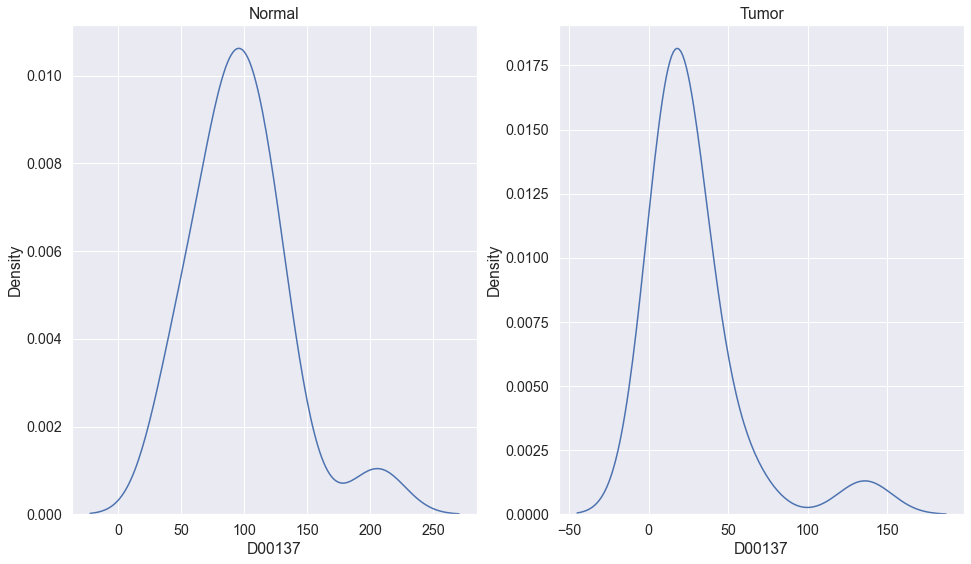

In [287]:
plt.figure(figsize=(16,9))
plt.subplot(1,2,1,title='Normal')
sns.kdeplot(expr_data[expr_data['Label']==1]['D00137'])
plt.subplot(1,2,2,title='Tumor')
sns.kdeplot(expr_data[expr_data['Label']==-1]['D00137'])

В анализе данных также часто применяется простой визуальный метод сравнения распределений: boxplot или ящик с усами.  На  графике ящика с усами в наглядном виде указана медиана выборки, выборочные квантили уровня 25% и 75%, а также потенциальные выбросы:


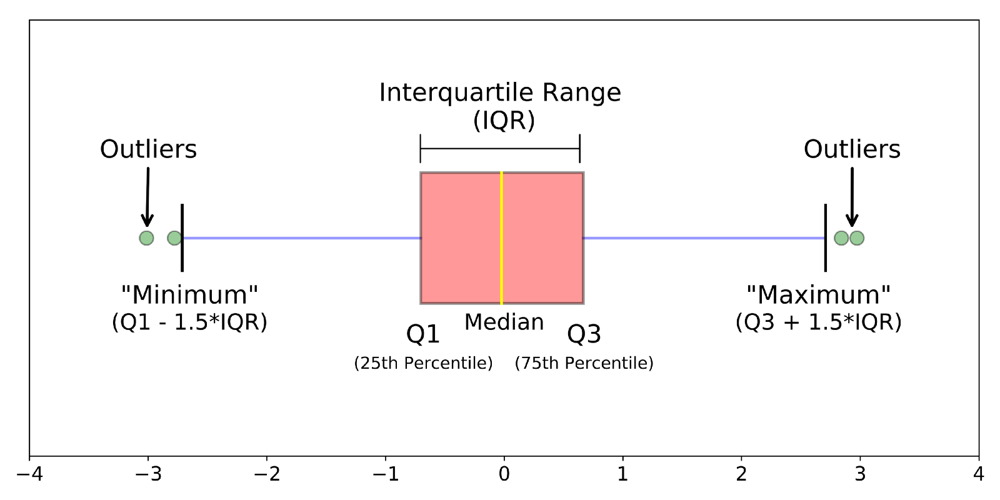

Постройте ящик с усами для гена `D00137`   , так чтобы по оси x был параметр `Label`, а по оси y &mdash; значения экспрессии, т.е. свой ящик для нормальной и раковой тканей. Используйте функцию `sns.boxplot`.

<AxesSubplot:title={'center':'D00137'}, xlabel='[Label]'>

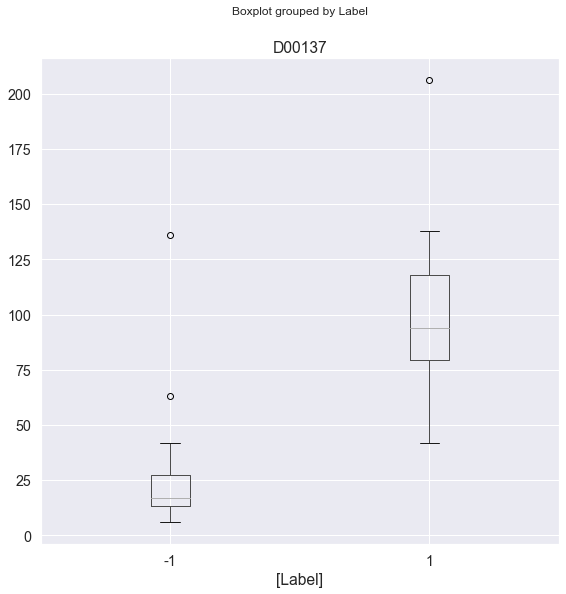

In [369]:
df_D00137 = pd.concat([expr_data[expr_data.Label==1].loc[:, ['D00137', 'Label']], 
                     expr_data[expr_data.Label==-1].loc[:, ['D00137', 'Label']]])
df_D00137.boxplot(by='Label',figsize=(9,9))

Постройте аналогичные графики, используя `seaborn.violinplot` , популярную модификацию boxplot-а.

<AxesSubplot:xlabel='Label', ylabel='D00137'>

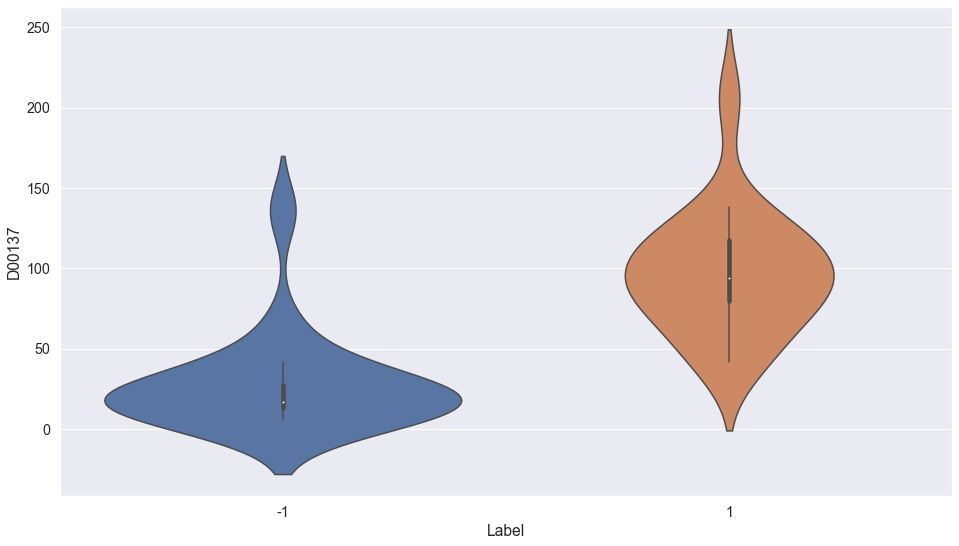

In [378]:
plt.figure(figsize=(16,9))
sns.violinplot(y=df_D00137['D00137'],x=df_D00137['Label'])

Как устроен violinplot ? Какой способ визуализации кажется вам более информативным? Почему?

**Ответ:** violinplot - это модификация boxplot с отрисовкой ещё и ядерной оценки плотности. Однако значение медианы на boxplot видно лучше и лично я бы предпочёл boxplot&&kdeplot

На графиках видно, что для одного случайного гена профили экспрессии возможно различаются.  
Но насколько это статистически достоверно и такова ли эта картина в целом?   
  
  
Для продолжения анализа необходимо понять, как именно были получены данные. Для этого обратимся к статье:  
_Gene intensity information was converted to a mean intensity for each gene by proprietary software (Affymetrix), which includes routines for filtering and centering the data (in these experiments, to 50 intensity units). Expression of genes related to smooth muscle and connective tissue was consistently greater in the normal than the tumor samples, probably because of the greater heterogeneity of tissue type in the normal samples_

Видим, что нормализация данных уже выполнена.
Во многих случаях для визуализации удобно переходить к логарифмическому формату данных.

Предварительный зрительный анализ может сказать очень многое о том, как устроены наши данные. Тем не менее, для получения полной картины простого взгляда на данные недостаточно. Первое на что нужно обрать внимание &mdash; это параметры распределения. Все распределения в первую очередь характеризуются медианой и средним. Для гена `D00137` вычислите медиану и средний уровень экспрессии в опухолевых и нормальных тканей.

In [396]:
M_n=np.median(df_D00137[df_D00137['Label']==1].iloc[:,0])
mean_n=df_D00137[df_D00137['Label']==1].iloc[:,0].mean()
M_t=np.median(df_D00137[df_D00137['Label']==-1].iloc[:,0])
mean_t=df_D00137[df_D00137['Label']==-1].iloc[:,0].mean()
print('normal Среднее ',mean_n,'и медиана',M_n)
print('tumor Среднее ','%.1f'%mean_t,'и медиана',M_t)

normal Среднее  97.0 и медиана 94.0
tumor Среднее  28.2 и медиана 17.0


Для того, чтобы утверждать, что "ген `X` овер-экспрессирован в опухолевых образцах", недостаточно просто посмотреть на боксплоты, необходимо провести статистический анализ.

Для анализ одного гена проверяются гипотезы о сравнении профилей экспрессий между опухолевыми и контрольными образцами:  
   $\mathsf{H}_0\colon$ для гена `X` не наблюдается разницы средних экспрессий;  
   $\mathsf{H}_1\colon$ для гена `X` наблюдается разница средних экспрессий.
    
Какой критерий стоит выбрать для проверки в предположении нормальности распределений? Воспользуйтесь этим критерием для проверки гипотезы для гена `Human class I alcohol dehydrogenase beta-1 subunit, allele 1 mRNA, complete cds` (см. столбец `Description`).

In [537]:
#D00003       "Human liver cytochrome P-450 mRNA, complete cds"
df_D00003 = pd.concat([expr_data[expr_data.Label==1].loc[:, ['D00003', 'Label']], 
                     expr_data[expr_data.Label==-1].loc[:, ['D00003', 'Label']]])

_В предположении нормальности воспользуемся двухвыборочным Т-критерием Стьюдента,так как выборки одинаковые по размеру,можно для надежности и воспользоваться случаем связных выборок_

In [564]:
norm=df_D00003[df_D00003.iloc[:,1]==1].iloc[:,0]
tum=df_D00003[df_D00003.iloc[:,1]==-1].iloc[:,0]
tum.size, norm.size
sps.ttest_ind(norm,tum,equal_var=False)

Ttest_indResult(statistic=1.1276695155100191, pvalue=0.2749102928974692)

<AxesSubplot:title={'center':'D00003'}, xlabel='[Label]'>

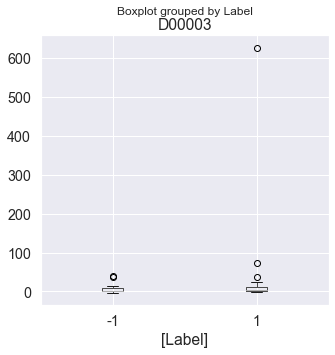

In [435]:
df_D00003.boxplot(by='Label',figsize=(5,5))

Проинтерпретируйте результаты:

Полученный p-value равен 0.25 , что говорит о том, что для гена D00003 не наблюдается овер-экспрессии

Давайте проверим, что наши данные действительно разделяются на два разных распределения. Для этого проверим, как будет работать этот же метод, если случайным образом перемешать метки подгрупп. Реализуйте случайное сэмплирование с помощью функции `random.choice` из библиотеки `numpy` и посмотрите, как изменится p-value (и изменится ли).

In [592]:
df1=pd.concat([expr_data[expr_data.Label==1].loc[:, ['D00003', 'Label']], 
                     expr_data[expr_data.Label==-1].loc[:, ['D00003', 'Label']]])
df1['Label']=np.random.choice([-1,1],size=(36,1))
norm=df1[df1.iloc[:,1]==1].iloc[:,0]
tum=df1[df1.iloc[:,1]==-1].iloc[:,0]
tum.size, norm.size
sps.ttest_ind(norm,tum,equal_var=False)

Ttest_indResult(statistic=-1.0569251405233047, pvalue=0.3022003325086005)

Сделайте вывод: Видно, что перемешивание не изменяет соотношение между p-value и уровнем значимости

И, наконец, самое интересное. Посчитайте, в каком проценте генов, для которых с уровнем значимости 0.05 наблюдается овер-экспрессия в опухолевых тканях. При этом важно выполнить поправку на множественное тестирование.

Сначала выполним несколько учебных заданий. 

а*) Реализуйте критерий, который вы использовали в предыдущем пункте, самостоятельно. 

In [ ]:
<...>

б) Реализуйте поправку Бонферрони (метод Бонферрони) самостоятельно. Функция должна возвращать результаты отвержения гипотез и скорректированные p-value.

In [622]:
def bonf(p_value,alpha=0.05):
    p = p_value*p_value.size
    a=np.zeros(p.size)
    for i in range(p.size):
        if(p[i]<0.05):
            a[i]=1
        else: a[i]=0
    return a,p

In [623]:
bonf(np.array([0.3,0.0001]))

(array([0., 1.]), array([6.e-01, 2.e-04]))

в) Проведите МПГ с использованием вашей реализации и с использованием реализации критерия из scipy и МПГ из statsmodels. В случае, если вы не выполняли пункт а), используйте только вашу реализацию пункта б). Сравните результаты.

In [666]:
T=np.zeros(expr_data.columns[:-1].size)
p=np.zeros(expr_data.columns[:-1].size)
j=0
for i in expr_data.columns[:-1]:
    norm=expr_data[expr_data['Label']==1][i].values
    tum=expr_data[expr_data['Label']==-1][i].values
    tum.size, norm.size
    T[j]=sps.ttest_ind(norm,tum)[0]
    p[j]=sps.ttest_ind(norm,tum)[1]
    j+=1

Какие методы контроля FWER можно использовать в данной задаче? Сделайте проверку с использованием наилучшего (наиболее мощного) возможного метода. Используйте стандартные реализации.

In [677]:
np.where(p<0.05)[0].size/expr_data['Label'].size

45.666666666666664

Далее используйте результаты последней проверки (с использованием наилучшего метода). Постройте гистограмму полученных значений p-value и скорректированных.

In [ ]:
<...>

Напечатайте число генов, для которых можно отвергнуть нулевую гипотезу, а также их долю среди всех генов.

In [ ]:
<...>

Посмотрим, какие же гены оверэкспрессированы. В коде ниже `p_vals_adjusted` &mdash; скорректированные значения p-value.

In [ ]:
for name, function in zip(
    expr_data.columns[np.where([p_vals_adjusted < 0.05])[1]], 
    descr[np.where([p_vals_adjusted < 0.05])[1]]
):
    print(name + ": " + function)